### 초기 설정 및 라이브러리 임포트

In [1]:
# 필요한 라이브러리 및 모듈 임포트
import gc
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from IPython.display import display, Audio
import pandas as pd
import librosa
import librosa.display
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')

In [2]:
# macOS에서 matplotlib 한글 폰트 설정
plt.rc('font', family='AppleGothic')  # macOS 기본 한글 폰트
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지

# GPU 메모리 정리 함수
def clear_gpu_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        print("GPU 메모리 정리 완료")
    else:
        print("CPU 사용 중 - 메모리 정리 완료")

### Hugging Face 로그인 설정

In [3]:
from huggingface_hub import login

# 직접 토큰 입력 방식
hf_token = input("Hugging Face 토큰을 입력하세요: ")

# HuggingFace 로그인
login(token=hf_token)

print("HuggingFace 로그인 완료!")

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


HuggingFace 로그인 완료!


### 오디오 파일 로드 및 시각화

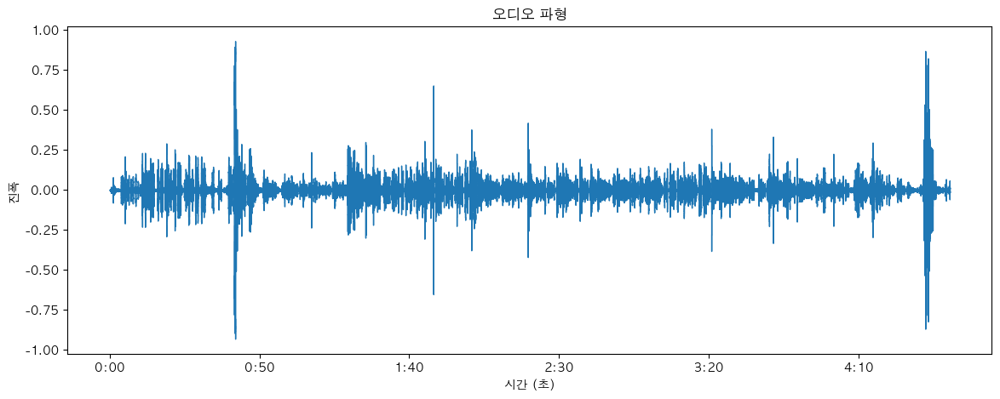

오디오 길이: 280.50초, 샘플링 레이트: 16000Hz


In [4]:
# 고정된 오디오 파일 경로 사용
audio_path = "data/sample.wav"

# 파일 존재 여부 확인
if not os.path.exists(audio_path):
    print(f"오류: {audio_path} 파일이 존재하지 않습니다.")
    print("data 폴더를 생성하고 sample.wav 파일을 넣어주세요.")
    
    # data 폴더 생성
    os.makedirs("data", exist_ok=True)
    print("data 폴더가 생성되었습니다. sample.wav 파일을 넣어주세요.")
else:
    # 오디오 시각화 및 재생
    y, sr = librosa.load(audio_path, sr=None)
    duration = librosa.get_duration(y=y, sr=sr)

    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(y, sr=sr)
    plt.title('오디오 파형')
    plt.xlabel('시간 (초)')
    plt.ylabel('진폭')
    plt.show()

    print(f"오디오 길이: {duration:.2f}초, 샘플링 레이트: {sr}Hz")
    display(Audio(audio_path))

### 화자 구분 (Speaker Diarization)

화자 구분 모델을 로드하고 있습니다...
MPS(Metal Performance Shaders) GPU 사용 중
화자 구분 실행 중... 디바이스: mps


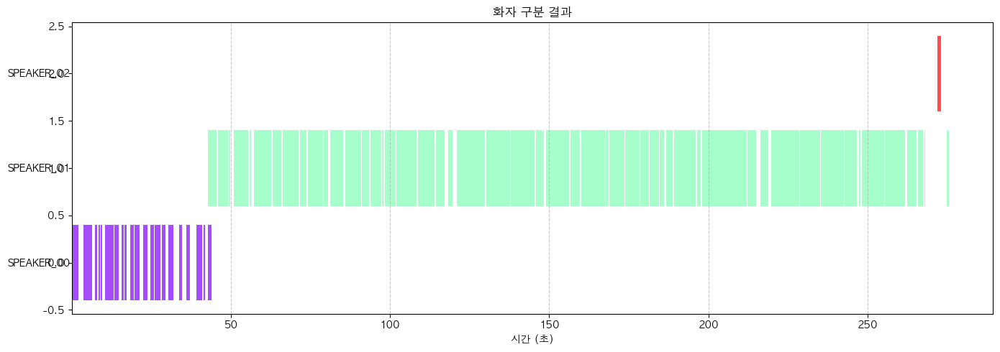

총 3명의 화자가 탐지되었습니다.
CPU 사용 중 - 메모리 정리 완료
화자 구분 모델 해제 완료


In [5]:
from pyannote.audio import Pipeline

print("화자 구분 모델을 로드하고 있습니다...")
try:
    diarization_pipeline = Pipeline.from_pretrained("pyannote/speaker-diarization-3.1",
                                                   use_auth_token=hf_token)

    # GPU 사용 가능 여부 확인
    # GPU 사용 가능 여부 확인 (Apple Silicon 지원 추가)
    if torch.backends.mps.is_available() and torch.backends.mps.is_built():
        device = torch.device("mps")
        print("MPS(Metal Performance Shaders) GPU 사용 중")
    elif torch.cuda.is_available():
        device = torch.device("cuda")
        print("CUDA GPU 사용 중")
    else:
        device = torch.device("cpu")
        print("CPU 사용 중")

    diarization_pipeline = diarization_pipeline.to(device)

    print(f"화자 구분 실행 중... 디바이스: {device}")
    diarization_result = diarization_pipeline(audio_path)

    # 결과 정리
    speakers = {}
    for turn, _, speaker in diarization_result.itertracks(yield_label=True):
        if speaker not in speakers:
            speakers[speaker] = []
        speakers[speaker].append({
            "start": turn.start,
            "end": turn.end,
            "duration": turn.end - turn.start
        })

    # 화자 구분 결과 시각화
    plt.figure(figsize=(14, 5))
    colors = plt.cm.rainbow(np.linspace(0, 1, len(speakers)))
    y_pos = 0

    for i, (speaker, segments) in enumerate(speakers.items()):
        for segment in segments:
            plt.barh(y_pos, segment["duration"], left=segment["start"],
                     color=colors[i], alpha=0.7)
        plt.text(-0.5, y_pos, speaker, ha="right", va="center")
        y_pos += 1

    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.xlabel('시간 (초)')
    plt.title('화자 구분 결과')
    plt.tight_layout()
    plt.show()

    print(f"총 {len(speakers)}명의 화자가 탐지되었습니다.")
except Exception as e:
    print(f"화자 구분 모델 로드 또는 실행 중 오류 발생: {e}")
    speakers = {}

# 화자 구분 모델 메모리 해제
if 'diarization_pipeline' in locals():
    del diarization_pipeline
    clear_gpu_memory()
    print("화자 구분 모델 해제 완료")

### 화자 분리 파일 저장

In [6]:
# 화자 구분 결과를 바탕으로 오디오 파일 분리 저장
if speakers:
    from pydub import AudioSegment
    import os
    
    # 출력 디렉토리 생성
    output_dir = "speaker_segments"
    os.makedirs(output_dir, exist_ok=True)
    
    # 오디오 파일 로드
    file_ext = os.path.splitext(audio_path)[1].lower()
    audio = AudioSegment.from_file(audio_path)
    
    print(f"각 화자별 오디오 분리 저장 중...")
    
    # 각 화자별 세그먼트 저장
    for speaker, segments in speakers.items():
        # 해당 화자의 모든 세그먼트를 하나로 결합
        combined = AudioSegment.empty()
        for segment in segments:
            start_ms = int(segment["start"] * 1000)
            end_ms = int(segment["end"] * 1000)
            segment_audio = audio[start_ms:end_ms]
            combined += segment_audio
        
        # 결합된 오디오 저장
        combined_path = os.path.join(output_dir, f"{speaker}_combined{file_ext}")
        combined.export(combined_path, format=file_ext[1:])
        print(f"  - {speaker} 저장 완료: 길이 {len(combined)/1000:.2f}초")

각 화자별 오디오 분리 저장 중...
  - SPEAKER_00 저장 완료: 길이 26.66초
  - SPEAKER_01 저장 완료: 길이 202.27초
  - SPEAKER_02 저장 완료: 길이 1.08초


### Whisper를 이용한 전체 음성 인식

In [7]:
from faster_whisper import WhisperModel
import os
from tqdm import tqdm
import pandas as pd

os.environ["PYTORCH_MPS_HIGH_WATERMARK_RATIO"] = "0.0"

try:
    print("Whisper 모델을 로드하고 있습니다...")
    whisper_device = "cpu"
    
    model = WhisperModel("large-v3-turbo", device=whisper_device)
    print(f"Whisper 모델 로드 완료! (디바이스: {whisper_device})")
    
    # 각 화자별 텍스트를 저장할 딕셔너리
    speaker_transcripts = {}
    
    # 모든 세그먼트 정보를 저장할 리스트 (대화 정리용)
    all_segments = []
    
    print("화자별 STT 실행 중...")
    # 화자별 STT 실행
    for speaker, segments in speakers.items():
        print(f"\n{speaker}의 STT 실행 중...")
        speaker_text = []  # 이 화자의 모든 텍스트를 저장할 리스트
        
        for segment in tqdm(segments):
            start = segment["start"]
            end = segment["end"]
            start_ms = int(start * 1000)
            end_ms = int(end * 1000)
            segment_audio = audio[start_ms:end_ms]
            
            # 세그먼트 오디오 저장
            segment_path = os.path.join(output_dir, f"{speaker}_{start:.2f}_{end:.2f}{file_ext}")
            segment_audio.export(segment_path, format=file_ext[1:])
            
            # STT 실행
            segments_result, info = model.transcribe(segment_path, language="ko", task="transcribe")
            transcript = " ".join([seg.text for seg in segments_result])
            
            # 이 세그먼트의 텍스트를 저장
            speaker_text.append(transcript)
            
            # 대화 정리용 세그먼트 정보 저장
            segment_copy = segment.copy()
            segment_copy["speaker"] = speaker
            segment_copy["text"] = transcript
            all_segments.append(segment_copy)
            
            print(f"  - {speaker} ({start:.2f}s ~ {end:.2f}s): {transcript}")
        
        # 이 화자의 모든 텍스트를 합쳐서 저장
        speaker_transcripts[speaker] = " ".join(speaker_text)
        
        # 텍스트 파일로 저장
        with open(os.path.join(output_dir, f"{speaker}_transcript.txt"), "w", encoding="utf-8") as f:
            f.write(speaker_transcripts[speaker])
        
    print("화자별 STT 완료!")
    
    # 시간순 정렬
    all_segments.sort(key=lambda x: x["start"])
    
    # 데이터프레임으로 변환 및 출력
    df_conversation = pd.DataFrame(all_segments)
    print("\n대화 흐름:")
    print(df_conversation[["speaker", "start", "end", "duration", "text"]])
    
    # 전체 오디오에 대한 STT
    print("전체 오디오에 대한 STT 실행 중...")
    segments_result, info = model.transcribe(audio_path, language="ko", task="transcribe")
    full_transcript = " ".join([segment.text for segment in segments_result])

    # 전체 텍스트 파일로 저장
    with open(os.path.join(output_dir, "full_transcript.txt"), "w", encoding="utf-8") as f:
        f.write(full_transcript)

    print("\n전체 텍스트 변환 결과:")
    print(full_transcript)
except Exception as e:
    print(f"Whisper 모델 로드 또는 실행 중 오류 발생: {e}")
    full_transcript = "텍스트 변환 실패"
    speaker_transcripts = {}
    all_segments = []

# 사용 후 메모리 해제
if 'model' in locals():
    del model
    clear_gpu_memory()
    print("Whisper 모델 해제 완료")

Whisper 모델을 로드하고 있습니다...


[2025-04-19 16:40:48.418] [ctranslate2] [thread 177943025] [warning] The compute type inferred from the saved model is float16, but the target device or backend do not support efficient float16 computation. The model weights have been automatically converted to use the float32 compute type instead.


Whisper 모델 로드 완료! (디바이스: cpu)
화자별 STT 실행 중...

SPEAKER_00의 STT 실행 중...


  5%|▍         | 1/22 [00:04<01:38,  4.71s/it]

  - SPEAKER_00 (0.03s ~ 2.06s):  그래도 좀 올라왔다고 생각하거든요


  9%|▉         | 2/22 [00:08<01:27,  4.38s/it]

  - SPEAKER_00 (3.64s ~ 6.51s):  뭔가 개인적으로도 그 이상으로 뭔가 하고 싶긴 한데


 14%|█▎        | 3/22 [00:12<01:16,  4.01s/it]

  - SPEAKER_00 (7.42s ~ 7.95s):  그리고


 18%|█▊        | 4/22 [00:15<01:09,  3.83s/it]

  - SPEAKER_00 (8.43s ~ 8.82s):  계속


 23%|██▎       | 5/22 [00:19<01:03,  3.74s/it]

  - SPEAKER_00 (9.18s ~ 9.65s):  그...


 27%|██▋       | 6/22 [00:23<01:02,  3.88s/it]

  - SPEAKER_00 (10.58s ~ 13.14s):  제 머릿속에도 기회비용 생각을 하는거죠


 32%|███▏      | 7/22 [00:27<00:58,  3.92s/it]

  - SPEAKER_00 (13.43s ~ 14.83s):  여기에서 근무한 거랑


 36%|███▋      | 8/22 [00:31<00:54,  3.88s/it]

  - SPEAKER_00 (15.79s ~ 16.37s):  여기서 이제


 41%|████      | 9/22 [00:37<00:58,  4.47s/it]

  - SPEAKER_00 (16.72s ~ 17.26s):  104


 45%|████▌     | 10/22 [00:41<00:51,  4.29s/it]

  - SPEAKER_00 (18.37s ~ 19.64s):  개척하면서 일하는 것도


 50%|█████     | 11/22 [00:45<00:47,  4.28s/it]

  - SPEAKER_00 (19.88s ~ 21.41s):  장점이 있다고 생각해요  그거랑


 55%|█████▍    | 12/22 [00:49<00:41,  4.15s/it]

  - SPEAKER_00 (22.41s ~ 23.74s):  그 좋은 시그니어 밑에서


 59%|█████▉    | 13/22 [00:53<00:36,  4.05s/it]

  - SPEAKER_00 (24.70s ~ 25.98s):  그 일을 했을 때


 64%|██████▎   | 14/22 [00:57<00:32,  4.02s/it]

  - SPEAKER_00 (26.10s ~ 27.93s):  거기서 얻는 기회병


 68%|██████▊   | 15/22 [01:00<00:27,  3.94s/it]

  - SPEAKER_00 (28.43s ~ 29.60s):  그 사이를


 73%|███████▎  | 16/22 [01:04<00:23,  3.95s/it]

  - SPEAKER_00 (30.37s ~ 32.04s):  저도 고민을 하게 되더라구요


 77%|███████▋  | 17/22 [01:08<00:19,  3.88s/it]

  - SPEAKER_00 (33.87s ~ 34.66s):  그래서 이게


 82%|████████▏ | 18/22 [01:12<00:15,  3.86s/it]

  - SPEAKER_00 (36.06s ~ 37.27s):  아 이거 모르겠어요 이게


 86%|████████▋ | 19/22 [01:16<00:11,  3.87s/it]

  - SPEAKER_00 (39.32s ~ 41.00s):  시니어가 있어야 되지 않나?


 91%|█████████ | 20/22 [01:20<00:07,  3.85s/it]

  - SPEAKER_00 (41.56s ~ 41.93s):  감사합니다.


 95%|█████████▌| 21/22 [01:23<00:03,  3.83s/it]

  - SPEAKER_00 (42.76s ~ 42.89s):  감사합니다.


100%|██████████| 22/22 [01:27<00:00,  3.98s/it]


  - SPEAKER_00 (42.91s ~ 43.94s):  아 진짜 그래

SPEAKER_01의 STT 실행 중...


  2%|▏         | 1/55 [00:04<03:46,  4.19s/it]

  - SPEAKER_01 (42.89s ~ 45.56s):  제가 이제 화답하면 돼요.


  4%|▎         | 2/55 [00:08<03:32,  4.01s/it]

  - SPEAKER_01 (46.07s ~ 49.24s):  오늘 오전에 이제


  5%|▌         | 3/55 [00:11<03:18,  3.82s/it]

  - SPEAKER_01 (49.47s ~ 49.73s):  감사합니다.


  7%|▋         | 4/55 [00:16<03:26,  4.05s/it]

  - SPEAKER_01 (50.86s ~ 55.41s):  일단 시니어 두 분한테 개인적으로 연락을 좀 드렸고


  9%|▉         | 5/55 [00:19<03:17,  3.96s/it]

  - SPEAKER_01 (55.89s ~ 56.36s):  감사합니다.


 11%|█         | 6/55 [00:24<03:17,  4.03s/it]

  - SPEAKER_01 (57.34s ~ 62.70s):  일단은 할 수 있는 걸 정해서 한번 모셔오려고 하는 분들이 있어요


 13%|█▎        | 7/55 [00:27<03:10,  3.96s/it]

  - SPEAKER_01 (63.09s ~ 64.19s):  오게 되면은


 15%|█▍        | 8/55 [00:31<03:06,  3.96s/it]

  - SPEAKER_01 (64.22s ~ 65.88s):  여러분들한테는 아마


 16%|█▋        | 9/55 [00:36<03:10,  4.15s/it]

  - SPEAKER_01 (66.25s ~ 71.40s):  어디서 같이 일하기 쉽지 않은 역량을 가지고 계신 분들인데


 18%|█▊        | 10/55 [00:40<03:04,  4.10s/it]

  - SPEAKER_01 (71.67s ~ 73.77s):  참여를 해주시기를 저도 바라고 있고


 20%|██        | 11/55 [00:44<02:56,  4.02s/it]

  - SPEAKER_01 (74.20s ~ 76.17s):  그리고 이제 이 부분에 대해서는


 22%|██▏       | 12/55 [00:48<02:54,  4.05s/it]

  - SPEAKER_01 (76.32s ~ 78.99s):  저도 일단 아까 뭐 처음에 걷었을 때


 24%|██▎       | 13/55 [00:52<02:45,  3.94s/it]

  - SPEAKER_01 (79.21s ~ 80.46s):  그런 거 아니고


 25%|██▌       | 14/55 [00:56<02:45,  4.03s/it]

  - SPEAKER_01 (81.17s ~ 85.28s):  거둔 거 아니고 제가 호프랑 맷을 처음에 이제


 27%|██▋       | 15/55 [01:00<02:45,  4.14s/it]

  - SPEAKER_01 (86.03s ~ 91.02s):  데리고 올 때 저는 두 분의 가능성을 정말 많이 봤었어요.


 29%|██▉       | 16/55 [01:04<02:39,  4.09s/it]

  - SPEAKER_01 (91.24s ~ 93.52s):  그래서 저는 두분을 채용을 할 때


 31%|███       | 17/55 [01:08<02:35,  4.10s/it]

  - SPEAKER_01 (93.87s ~ 97.21s):  진짜 기대감이 엄청나게 큰 상태로 채용을 했었어요


 33%|███▎      | 18/55 [01:12<02:26,  3.96s/it]

  - SPEAKER_01 (97.50s ~ 98.04s):  그리고


 35%|███▍      | 19/55 [01:16<02:27,  4.08s/it]

  - SPEAKER_01 (98.36s ~ 101.79s):  두 분은 저의 기대에 이상으로 잘해주셨습니다.


 36%|███▋      | 20/55 [01:21<02:28,  4.23s/it]

  - SPEAKER_01 (102.14s ~ 108.25s):  정말로 잘해줬기 때문에 그래서 제가 항상 두 분을 거기가 항상 묶어서 정말


 38%|███▊      | 21/55 [01:26<02:30,  4.43s/it]

  - SPEAKER_01 (108.76s ~ 114.12s):  진짜 저한테 되게 보물 같은 이런 존재가 회사에 입사를 해줬다 이런 이야기를.


 40%|████      | 22/55 [01:30<02:23,  4.36s/it]

  - SPEAKER_01 (114.49s ~ 117.08s):  밖에 나가서 정말 많이 하고 돌아다녔고


 42%|████▏     | 23/55 [01:34<02:13,  4.18s/it]

  - SPEAKER_01 (117.78s ~ 117.82s):  감사합니다.


 44%|████▎     | 24/55 [01:38<02:09,  4.17s/it]

  - SPEAKER_01 (118.32s ~ 119.64s):  당사자들한테 안해서


 45%|████▌     | 25/55 [01:43<02:18,  4.61s/it]

  - SPEAKER_01 (121.01s ~ 129.90s):  죄송한데 항상 그렇게 얘기를 하면서 돌아다녔었고  저도 이제 미안한 거는  시니어들을 저희가 몇 번 채용을 했었었죠.  작년에도 기억을 하시겠지만


 47%|████▋     | 26/55 [01:49<02:21,  4.87s/it]

  - SPEAKER_01 (130.39s ~ 137.68s):  두 명을 채용을 했었고  둘 다 하나는 온다고 그러고 안 왔고  하나는 왔다가 도망갔고  이런 식의 상황이 계속


 49%|████▉     | 27/55 [01:54<02:21,  5.04s/it]

  - SPEAKER_01 (137.98s ~ 145.48s):  왔다 갔다 하게 되면서 그거는 아까 토비가 얘기한 것 같은 부분이 좀 있어요.  그 적응하는 어떤 프로세스에 대한 부분들 문제도 좀 있고.


 51%|█████     | 28/55 [01:58<02:06,  4.68s/it]

  - SPEAKER_01 (145.93s ~ 147.62s):  그건 이제 다른 이야기고


 53%|█████▎    | 29/55 [02:02<01:53,  4.38s/it]

  - SPEAKER_01 (147.99s ~ 148.46s):  그래서


 55%|█████▍    | 30/55 [02:07<01:52,  4.50s/it]

  - SPEAKER_01 (149.02s ~ 156.21s):  저도 이제 여러분들이 여러분들에게 모든 게 다 갖춰져 있는 상태면 가장 좋을 텐데 사실 스타트업이라는 게


 56%|█████▋    | 31/55 [02:11<01:45,  4.40s/it]

  - SPEAKER_01 (156.70s ~ 159.70s):  그렇게 시작을 하기가 사실은 어려워요. 어렵고.


 58%|█████▊    | 32/55 [02:16<01:48,  4.71s/it]

  - SPEAKER_01 (160.17s ~ 167.58s):  운인 것 같아 그게 뭐냐면 뭐 시니어들 부터 다 채워져 있고 주니어들이 들어오는 이제 이런식으로 구조로 돌아가는 것도 있고


 60%|██████    | 33/55 [02:20<01:37,  4.43s/it]

  - SPEAKER_01 (167.84s ~ 168.75s):  우리처럼


 62%|██████▏   | 34/55 [02:25<01:33,  4.47s/it]

  - SPEAKER_01 (168.97s ~ 173.76s):  다들 경력이 많지는 않지만 굉장히 뛰어난 포텐셜을 가지고 있는 분들이 모여서


 64%|██████▎   | 35/55 [02:29<01:29,  4.48s/it]

  - SPEAKER_01 (173.83s ~ 178.50s):  스스로 하나씩 만들어가는 구조가 있는데  둘은 사실 장단점은 있어요.


 65%|██████▌   | 36/55 [02:33<01:23,  4.41s/it]

  - SPEAKER_01 (178.74s ~ 181.30s):  앞에 말한 전자의 스타트업들은


 67%|██████▋   | 37/55 [02:38<01:18,  4.37s/it]

  - SPEAKER_01 (181.54s ~ 184.53s):  굉장히 많은 주니어들이 입사람은 많이 나가요.


 69%|██████▉   | 38/55 [02:41<01:11,  4.19s/it]

  - SPEAKER_01 (184.85s ~ 186.16s):  힘들거든요 왜냐면


 71%|███████   | 39/55 [02:46<01:06,  4.16s/it]

  - SPEAKER_01 (186.72s ~ 188.86s):  가는 길이 힘드니까 시니어들은 그러면


 73%|███████▎  | 40/55 [02:51<01:09,  4.60s/it]

  - SPEAKER_01 (189.30s ~ 196.12s):  따라오는 주니어들한테 못 따라오면 나가.  이런 식의 억압적인 태도를 원래 많이 취할 수밖에 없어요.  모두가 힘들기 때문에.


 75%|███████▍  | 41/55 [02:55<01:00,  4.36s/it]

  - SPEAKER_01 (196.42s ~ 197.55s):  그래서 그게


 76%|███████▋  | 42/55 [03:02<01:06,  5.14s/it]

  - SPEAKER_01 (197.97s ~ 212.05s):  좋다 나쁘다. 아까 기회비용 얘기도 하셨는데  그거는 개인적인 선택에 따라 다를 것 같고  근데 그럼에도 불구하고  저는 그런 식으로 생각을 하지만  그럼에도 불구하고 여러분들한테 그런 니즈가 있으면  제가 채워주려고 노력을 하는 게 맞는 거고


 78%|███████▊  | 43/55 [03:06<00:57,  4.81s/it]

  - SPEAKER_01 (212.40s ~ 215.07s):  그래서 이제 이번에도 많이 고민을 하다가


 80%|████████  | 44/55 [03:10<00:51,  4.65s/it]

  - SPEAKER_01 (216.42s ~ 218.83s):  선고초려를 좀 해서 좀 데리고 올 생각인데


 82%|████████▏ | 45/55 [03:15<00:48,  4.85s/it]

  - SPEAKER_01 (219.83s ~ 228.69s):  회사에는 굉장히 큰 집, 출혈이 있을 수는 있어요.  어쨌든 그렇게 와서 우리가 더 좋은 멤버로 구성이 돼서, 간압이 돼서


 84%|████████▎ | 46/55 [03:20<00:43,  4.83s/it]

  - SPEAKER_01 (228.70s ~ 235.15s):  더 빠르게 더 좋은 것들을 만들어 나갈 수 있으면  그런 비용은 충분히 지불할 수 있겠다는 생각을 해서


 85%|████████▌ | 47/55 [03:26<00:39,  4.95s/it]

  - SPEAKER_01 (235.25s ~ 242.52s):  그리고 맷도, 호프도 계속 거기에 대한 굉장히 간절함을 얘기를 하셨기 때문에  나도 되게 미안하다는 생각도 많이 들고 해서


 87%|████████▋ | 48/55 [03:30<00:33,  4.80s/it]

  - SPEAKER_01 (242.81s ~ 246.69s):  그건 이제 진행 중이니까 조금만 기다려 주시면 좋겠고


 89%|████████▉ | 49/55 [03:34<00:26,  4.49s/it]

  - SPEAKER_01 (247.30s ~ 247.72s):  감사합니다.


 91%|█████████ | 50/55 [03:39<00:22,  4.59s/it]

  - SPEAKER_01 (248.16s ~ 255.32s):  이제 이거는 계속 제가 기다려 달라는 얘기를 굉장히 긴 시간 한 상태가 돼서 이제 거의 양치기가 된 상황이긴 한데


 93%|█████████▎| 51/55 [03:43<00:18,  4.57s/it]

  - SPEAKER_01 (255.48s ~ 261.83s):  이번에는 어떤 식으로든 제가 마무리를 지으려고 해요.  그래서 그 부분은..


 95%|█████████▍| 52/55 [03:47<00:13,  4.42s/it]

  - SPEAKER_01 (262.59s ~ 265.39s):  지금까지 어쨌든 참아주고 이해해줘서


 96%|█████████▋| 53/55 [03:51<00:08,  4.26s/it]

  - SPEAKER_01 (265.86s ~ 267.48s):  고맙고 미안하고


 98%|█████████▊| 54/55 [03:55<00:04,  4.12s/it]

  - SPEAKER_01 (267.82s ~ 268.21s):  감사합니다.


100%|██████████| 55/55 [04:02<00:00,  4.40s/it]


  - SPEAKER_01 (275.01s ~ 275.67s):  그리고 또

SPEAKER_02의 STT 실행 중...


 50%|█████     | 1/2 [00:03<00:03,  3.85s/it]

  - SPEAKER_02 (43.94s ~ 43.97s):  감사합니다.


100%|██████████| 2/2 [00:07<00:00,  3.78s/it]

  - SPEAKER_02 (272.02s ~ 273.07s):  감사합니다.
화자별 STT 완료!

대화 흐름:
       speaker       start         end  duration  \
0   SPEAKER_00    0.030969    2.055969  2.025000   
1   SPEAKER_00    3.642219    6.510969  2.868750   
2   SPEAKER_00    7.422219    7.945344  0.523125   
3   SPEAKER_00    8.434719    8.822844  0.388125   
4   SPEAKER_00    9.177219    9.649719  0.472500   
..         ...         ...         ...       ...   
74  SPEAKER_01  262.589094  265.390344  2.801250   
75  SPEAKER_01  265.862844  267.482844  1.620000   
76  SPEAKER_01  267.820344  268.208469  0.388125   
77  SPEAKER_02  272.022219  273.068469  1.046250   
78  SPEAKER_01  275.009094  275.667219  0.658125   

                             text  
0              그래도 좀 올라왔다고 생각하거든요  
1    뭔가 개인적으로도 그 이상으로 뭔가 하고 싶긴 한데  
2                             그리고  
3                              계속  
4                            그...  
..                            ...  
74            지금까지 어쨌든 참아주고 이해해줘서  
75                     


전체 텍스트 변환 결과:
 좀 올라왔다고 생각하거든요.  뭔가 개인적으로도 그 이상으로 뭔가 하고 싶긴 한데  사실 계속 제 머릿속에도 기회비용 생각을 하는 거죠.  제가 여기에서 근무하는 거랑  여기서 이제 혼자서 이렇게 개척하면서 일하는 것도 장점이 있다고 생각해요.  그거랑 좋은 시니어 밑에서 일을 했을 때  거기서 얻는 기회비용  그 차이를 주로 고민을 하게 되더라고요.  그래서 이게  아 모르겠어요.  이게 시니어가 있어야 되지 않나.  제가 이제 화답하면 돼요.  오늘 오전에 이제  일단 시니어 두 분한테  이제 개인적으로 연락을 좀 드렸고  일단은 할 수 있는 걸 다 해서  한번 모셔오려고 하는 분들이 있어요.  오게 되면은 여러분들한테는 아마  어디서 같이 일하기 이렇게 많이 쉽지 않은  역량을 가지고 계신 분들인데  합류를 해주시기를 저도 바라고 있고  그리고 이제 이 부분에 대해서는 저도  일단 아까 뭐 처음에 거둔 거 아니고  거둔 거 아니고  제가 뭐 호프랑 맷을 처음에 이제  데리고 올 때 저는 두 분의 가능성을 정말 많이 봤었어요.  그래서 저는 두 분을 채용을 할 때  진짜 기대감이 엄청나게 큰 상태로 채용을 했었어요.  그리고 두 분은 저의 기대 이상으로 잘해주셨어요.  정말로 잘해줬기 때문에  그래서 제가 항상 두 분을  거기가 항상 묶어서  정말 진짜 이제 저한테 되게 보물 같은  이제 이런 존재가  이제 회사에 이제 입사를 해줬다.  이런 이야기를 밖에 나가서  정말 많이 하고 돌아다녔고  당사자들한테 안 해서  죄송한데  죄송한데  이제 항상 그렇게 얘기를 하면서 돌아다녔었고  이제 저도 이제 미안한 거는  시니어들을 저희가 몇 번 채용을 했었었죠.  작년에도 기억을 하시겠지만  두 명을 채용을 했었었고  둘 다 이제 하나는 온다고 그러고 안 왔고  하나는 왔다가 도망갔고  이제 이런 식의 상황이 계속 왔다 갔다 하게 되면서  그거는 아까 토비가 얘기한 것 같은 부분이 좀 있어요.  적응하는 어떤 프로세스에 대한 부분들의 

### 텍스트 요약

In [10]:
from transformers import pipeline, AutoTokenizer, AutoModelForSeq2SeqLM

model_options = {
    "1": "ainize/kobart-news",  # 뉴스 요약에 특화
    "2": "psyche/KoT5-summarization",  # T5 기반 요약
    "3": "eenzeenee/t5-base-korean-summarization",  # 또 다른 T5 기반 요약
    "4": "noahkim/KoBART-news-summarization"  # 뉴스에 fine-tuning된 KoBART
}

# 선택한 모델명
model_name = model_options["2"]  # 원하는 모델로 변경

# 토크나이저와 모델 로드
tokenizer = AutoTokenizer.from_pretrained(model_name)

# T5 기반 모델인 경우 (모델명에 't5'가 포함된 경우)
if 't5' in model_name.lower():
    summary_model = AutoModelForSeq2SeqLM.from_pretrained(model_name)
    summarizer = pipeline("summarization", 
                         model=summary_model, 
                         tokenizer=tokenizer, 
                         device="cpu",
                         framework="pt")
else:  # BART 기반 모델
    summary_model = AutoModelForSeq2SeqLM.from_pretrained(model_name)
    summarizer = pipeline("summarization", 
                         model=summary_model, 
                         tokenizer=tokenizer, 
                         device="cpu")

# 입력 길이에 맞게 max_length 조정 함수
def adaptive_summarize(text, min_ratio=0.2, max_ratio=0.5):
    """입력 텍스트 길이에 비례하여 요약 길이 조정"""
    if not text or len(text) < 100:
        return text
        
    input_len = len(text)
    # 최소 길이는 입력의 20%, 최대 길이는 입력의 50%로 설정
    min_length = max(30, int(input_len * min_ratio))
    max_length = max(50, int(input_len * max_ratio))
    
    # 최대 길이는 모델이 처리할 수 있는 범위 내로 제한
    max_length = min(max_length, 512)
    
    try:
        # 요약 실행
        summary = summarizer(text, 
                            max_length=max_length, 
                            min_length=min_length, 
                            do_sample=False)
        return summary[0]['summary_text']
    except Exception as e:
        print(f"요약 중 오류 발생: {e}")
        return text[:100] + "... (요약 실패)"


def preprocess_text(text):
    """텍스트 전처리: 불필요한 반복, 공백 제거 등"""
    import re
    
    # 연속된 같은 단어/문장 제거 (예: "감사합니다" 반복)
    # 3회 이상 반복되는 같은 단어 패턴 찾기
    pattern = r'(\S+(?:\s+\S+){0,3})(?:\s+\1){2,}'
    while re.search(pattern, text):
        text = re.sub(pattern, r'\1', text)
    
    # 불필요한 공백 제거
    text = re.sub(r'\s+', ' ', text).strip()
    
    # 불필요한 특수문자 처리
    text = re.sub(r'[\.\,\?\!]{2,}', '.', text)
    
    return text


def chunk_text_by_sentences(text, max_chunk_length=500):
    """문장 단위로 텍스트를 나누기 (의미 단위 보존)"""
    import re
    
    # 문장 단위로 분리
    sentences = re.split(r'(?<=[.!?])\s+', text)
    
    chunks = []
    current_chunk = ""
    
    for sentence in sentences:
        # 문장이 너무 길면 단어 단위로 분리
        if len(sentence) > max_chunk_length:
            words = sentence.split()
            temp_sentence = ""
            for word in words:
                if len(temp_sentence) + len(word) + 1 > max_chunk_length:
                    chunks.append(temp_sentence)
                    temp_sentence = word
                else:
                    temp_sentence += " " + word if temp_sentence else word
            if temp_sentence:
                current_chunk += " " + temp_sentence if current_chunk else temp_sentence
        else:
            # 현재 청크에 문장을 추가했을 때 최대 길이를 초과하면 새 청크 시작
            if len(current_chunk) + len(sentence) + 1 > max_chunk_length:
                chunks.append(current_chunk)
                current_chunk = sentence
            else:
                current_chunk += " " + sentence if current_chunk else sentence
    
    # 마지막 청크 추가
    if current_chunk:
        chunks.append(current_chunk)
    
    return chunks


try:
    print("\n개선된 텍스트 요약 모델 로드 중...")
    
    # 결과를 저장할 딕셔너리
    summaries = {
        "speakers": {},       # 화자별 요약
        "speakers_combined": "",  # 화자별 요약 통합본
        "full_text": ""       # 전체 텍스트 바로 요약
    }
    
    # 화자별 요약 생성
    if speaker_transcripts:
        print("\n화자별 텍스트 요약 중...")
        for speaker, text in speaker_transcripts.items():
            if len(text) > 100:  # 의미 있는 길이의 텍스트만 요약
                # 텍스트 전처리
                clean_text = preprocess_text(text)
                
                # 문장 단위로 청크 나누기
                chunks = chunk_text_by_sentences(clean_text, max_chunk_length=500)
                
                speaker_summary_parts = []
                for chunk in chunks:
                    if len(chunk) > 100:
                        try:
                            # 적응형 요약 길이 적용
                            summary_text = adaptive_summarize(chunk)
                            speaker_summary_parts.append(summary_text)
                        except Exception as chunk_e:
                            print(f"{speaker} 청크 요약 중 오류: {chunk_e}")
                            speaker_summary_parts.append(chunk[:100] + "... (요약 실패)")
                
                # 이 화자의 요약 저장
                summaries["speakers"][speaker] = " ".join(speaker_summary_parts)
                
                # 파일로 저장
                with open(os.path.join(output_dir, f"{speaker}_summary.txt"), "w", encoding="utf-8") as f:
                    f.write(summaries["speakers"][speaker])
                
                print(f"{speaker} 요약 완료: {summaries['speakers'][speaker][:100]}...")
            else:
                print(f"{speaker}의 텍스트가 너무 짧아 요약을 건너뜁니다.")
                summaries["speakers"][speaker] = text
        
        # 화자별 요약을 합쳐서 다시 요약 (개선된 방식)
        if summaries["speakers"]:
            # 화자 식별자와 함께 요약 결합 (더 의미 있는 형태로)
            combined_speaker_summaries = "\n\n".join([f"[{speaker}] {summary}" 
                                                  for speaker, summary in summaries["speakers"].items()])
            
            # 텍스트 전처리
            clean_combined = preprocess_text(combined_speaker_summaries)
            
            print("\n화자별 요약 통합 및 최종 요약 생성 중...")
            if len(clean_combined) > 100:
                try:
                    # 적응형 요약 길이 적용
                    summaries["speakers_combined"] = adaptive_summarize(clean_combined, 
                                                                      min_ratio=0.3, 
                                                                      max_ratio=0.6)
                    
                    # 파일로 저장
                    with open(os.path.join(output_dir, "speakers_combined_summary.txt"), "w", encoding="utf-8") as f:
                        f.write(summaries["speakers_combined"])
                    
                    print(f"화자별 요약 통합본:\n{summaries['speakers_combined']}")
                except Exception as e:
                    print(f"화자별 요약 통합 중 오류: {e}")
                    summaries["speakers_combined"] = clean_combined[:200] + "... (통합 요약 실패)"
    
    # 전체 텍스트 직접 요약 (개선된 방식)
    if len(full_transcript) > 100:
        print("\n전체 텍스트 직접 요약 중...")
        
        # 텍스트 전처리
        clean_full_text = preprocess_text(full_transcript)
        
        # 문장 단위로 청크 나누기
        chunks = chunk_text_by_sentences(clean_full_text, max_chunk_length=500)
        
        full_summary_parts = []
        for chunk in chunks:
            if len(chunk) > 100:
                try:
                    # 적응형 요약 길이 적용
                    summary_text = adaptive_summarize(chunk)
                    full_summary_parts.append(summary_text)
                except Exception as chunk_e:
                    print(f"전체 텍스트 청크 요약 중 오류: {chunk_e}")
                    full_summary_parts.append(chunk[:100] + "... (요약 실패)")
        
        # 전체 요약 저장
        summaries["full_text"] = " ".join(full_summary_parts)
        
        # 파일로 저장
        with open(os.path.join(output_dir, "full_text_summary.txt"), "w", encoding="utf-8") as f:
            f.write(summaries["full_text"])
        
        print(f"\n전체 텍스트 직접 요약 결과:\n{summaries['full_text']}")
    else:
        print("전체 텍스트가 너무 짧아 요약을 건너뜁니다.")
        summaries["full_text"] = full_transcript
    
    # 요약 모델 메모리 정리
    del summarizer, summary_model, tokenizer
    clear_gpu_memory()
    print("요약 모델 해제 완료")

except Exception as e:
    print(f"텍스트 요약 중 오류 발생: {e}")
    summaries = {"error": "요약 실패"}

Device set to use cpu
Your max_length is set to 124, but your input_length is only 94. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=47)



개선된 텍스트 요약 모델 로드 중...

화자별 텍스트 요약 중...


Your max_length is set to 237, but your input_length is only 176. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=88)


SPEAKER_00 요약 완료: 제 머릿속에도 기회비용 생각을 하는거죠 여기서 근무한 거랑 여기서 이제 104 개척하면서 일하는 것도 장점이 있다고 생각해요 그거랑 그 좋은 시그니어 밑에서 그 일을 했을 때 거기...


Your max_length is set to 242, but your input_length is only 187. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=93)
Your max_length is set to 178, but your input_length is only 136. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=68)
Your max_length is set to 173, but your input_length is only 131. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=65)
Your max_length is set to 512, but your input_length is only 466. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=233)

SPEAKER_01 요약 완료: 일단 시니어 두 분한테 개인적으로 연락을 드렸고 감사합니다. 일단 할 수 있는 걸 정해서 한번 모셔오려고 하는 분들이 있어요 오게 되면은 여러분들한테는 아마 어디서 같이 일하기 쉽...
SPEAKER_02의 텍스트가 너무 짧아 요약을 건너뜁니다.

화자별 요약 통합 및 최종 요약 생성 중...


Your max_length is set to 160, but your input_length is only 122. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=61)


화자별 요약 통합본:
스타트업은 가는 길이 힘드니까 주니어들은 못 따라오면 나가라는 식의 억압적인 태도를 많이 취할 수밖에 없다. 그런 니즈가 있으면 채워주려고 노력을 하는 게 맞는 거다. 그래서 선고초려를 해서 데리고 올 생각인데 회사에는 굉장히 큰 집, 출혈이 있을 수는 있어요. 그래서 이번에도 많이 고민을 하다가 선고 초려를 좀 해서 좀 데려올 생각인데 회사에 굉장히 큰 집이 있을 수 있어요. 우리가 더 좋은 멤버로 구성이 돼서 더 빠르게 더 좋은 것들을 만들어 나갈 수 있으면 그런 비용은 충분히 지불할 수 있겠다는 생각을 해서 맷도, 호프도 계속 거기에 대한 굉장히 간절함을 얘기를 하셨기 때문에 나도 되게 미안하다는 생각도 많이 들고 해서 그건 이제 진행 중이니까 조금만 기다려 주시면 좋겠고 감사합니다. 지금까지 어쨌든 참아주고 이해해줘서 고맙고 미안하고 고맙고 고맙고 감사하고 감사합니다. [SPEAKER_01] 일단 할 수 있는 걸 정해서 한번 모셔오려고 하는 분들이 있어요 오게 되면 여러분들한테는 아마 어디서 같이 일하기 쉽지 않은 역량을 가지고 계신 분들인데 참여를 해주시기를 저는 항상 두 분을 거기가 항상 묶어서 정말 보물 같은 이런 존재가 회사에 입사를 해줬다고 두 분한테 개인적으로 연락을 드렸고 감사하다는 생각이 많이 드셨기 때문에 저는 두 분의 가능성을 정말 많이 봤었고 저는 두 분을 제가 항상 두 분이 항상 늘 묶어서 보물 같은 존재가 회사에 입사해줬다고 제가 두 분을 항상 묶어줘서 보물 같은 존재로 회사에 입사 해줬다는 이야기를. 스타트업이라는 게 그렇게 시작을 하기가 사실 너무 너무 너무 많은 기대를 많이 봤었다. 그래서 저도 너무 미안하다는 생각을 많이 들었다. 그래서 오늘도 많이 고민하다가 선고 초려고를 해서 좀 더 빨리 더 좋은 것을 만들어 갈 수 있다는 생각을 많이 했다. 그래서 저는 이제 시작 중이니까 조금 기다려 주셨으면 좋겠고 감사하고 감사하다고 생각합니다. 지금까지 하여튼 참아 주고 이해해 줘서 감사합니다.

전체 텍스트

Your max_length is set to 232, but your input_length is only 177. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=88)
Your max_length is set to 240, but your input_length is only 181. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=90)
Your max_length is set to 165, but your input_length is only 123. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=61)
Your max_length is set to 179, but your input_length is only 132. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=66)



전체 텍스트 직접 요약 결과:
좋은 시니어 밑에서 일을 했을 때 거기서 얻는 기회비용 그 차이를 주로 고민을 하게 되더라고요. 그래서 이게 아 모르겠어요. 이게 시니어가 있어야 되지 않나. 제가 이제 화답하면 돼요. 오늘 오전에 이제 일단 시니어 두 분한테 이제 개인적으로 연락을 드렸고 일단은 할 수 있는 걸 다 해서 한번 모셔오려고 하는 분들이 있어요. 호프랑 맷을 처음 데리고 올 때 저는 두 분의 가능성을 정말 많이 봤었어요. 그래서 저는 두 분을 채용을 할 때 정말 기대감이 엄청나게 큰 상태로 채용을 했었어요. 그리고 두 분은 저의 기대 이상으로 잘해주셨기 때문에 그래서 제가 항상 두 분을 거기가 항상 묶어서 정말 보물 같은 존재가 이제 회사에 입사를 해줬다. 이런 이야기를 밖에 나가서 정말 많이 하고 돌아다녔고 죄송한데 죄송한데 이제 시니어들을 저희가 몇 번 채용했었었죠. 스타트업은 시니어부터 채워져 있고 주니어들이 들어오는 구조로 돌아가는 것도 있고 뛰어난 포텐셜을 가지고 있는 사람들이 모여서 스스로 하나씩 만들어가는 구조가 있는데 둘은 사실 장단점은 있어요. 앞의 말한 전자의 스타트업들은 굉장히 많은 주니어들이 입사를 하면 많이 나가요. 힘들거든요. 그래서 스타트업이라는 게 그렇게 시작을 하기가 사실은 어려워요. 왜냐하면 시니어들부터 다 채워진 상태에서 주니어들이 들어오게 되는 구조도 있고 우리처럼 다들 경력이 많지는 않지만 굉장히 탁월한 포텐션을 가지고 있는 분들이 모여서 스스로 조금씩 만들어가는 구조는 사실은 장단점이 있어요. 시니어들은 가는 길이 힘드니까 따라오는 주니어들한테 못 따라오면 나가라는 식의 억압적인 태도를 원래 많이 취할 수밖에 없어요. 그래서 그건 개인적인 선택에 따라 다를 것 같고 그럼에도 불구하고 여러분들한테 그런 니즈가 있으면 제가 채워주려고 노력을 하는 게 맞는 거고 그래서 이번에도 많이 고민을 하다가 선고초려를 좀 해서 좀 데리고 올 생각인데 회사에는 굉장히 큰 집이 그게 출혈이 있을 수는 있어요. 우리가 더 좋은 멤버

### Gradio 인터페이스로 결과 시각화

In [9]:
import gradio as gr

def create_conversation_display():
    if not all_segments:
        return "<p>대화 내용을 표시할 수 없습니다.</p>"
        
    html = "<h3>대화 내용 (시간순)</h3>"
    html += "<table style='width:100%; border-collapse: collapse;'>"
    html += "<tr><th style='border:1px solid black; padding:8px;'>화자</th><th style='border:1px solid black; padding:8px;'>시작 시간</th><th style='border:1px solid black; padding:8px;'>끝 시간</th><th style='border:1px solid black; padding:8px;'>내용</th></tr>"

    for segment in all_segments:
        speaker = segment["speaker"]
        start = segment["start"]
        end = segment["end"]
        
        # 세그먼트별 텍스트 사용
        text = segment.get("text", "(텍스트 없음)")

        html += f"<tr><td style='border:1px solid black; padding:8px;'>{speaker}</td>"
        html += f"<td style='border:1px solid black; padding:8px;'>{start:.2f}</td>"
        html += f"<td style='border:1px solid black; padding:8px;'>{end:.2f}</td>"
        html += f"<td style='border:1px solid black; padding:8px;'>{text}</td></tr>"

    html += "</table>"
    return html

try:
    # Gradio 인터페이스
    with gr.Blocks() as demo:
        gr.HTML("<h1>STT 및 화자 구분 결과</h1>")

        with gr.Tab("오디오"):
            gr.Audio(audio_path)

        with gr.Tab("전체 텍스트"):
            gr.Textbox(full_transcript, label="전체 텍스트")

        if speaker_transcripts:
            with gr.Tab("화자별 텍스트"):
                for speaker, text in speaker_transcripts.items():
                    gr.Textbox(text, label=f"화자 {speaker}")

        if all_segments:
            with gr.Tab("대화 흐름"):
                gr.HTML(create_conversation_display())

    demo.launch()
except Exception as e:
    print(f"Gradio 인터페이스 생성 중 오류 발생: {e}")
    print("결과는 콘솔 출력으로 확인하세요.")

print("분석이 완료되었습니다!")

* Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


분석이 완료되었습니다!
